[0, 1, 2, 3, 4, 5]
INFO:tensorflow:Restoring parameters from models/N-style_final.ckpt


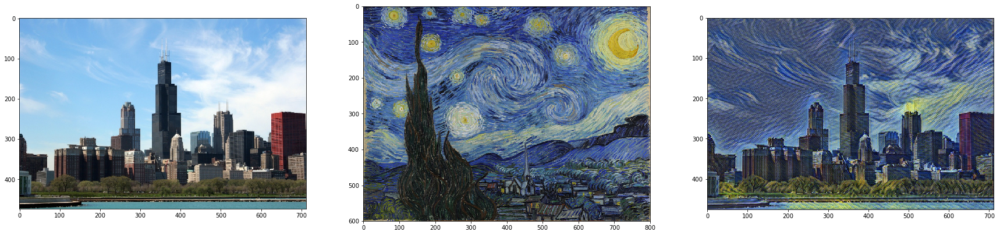

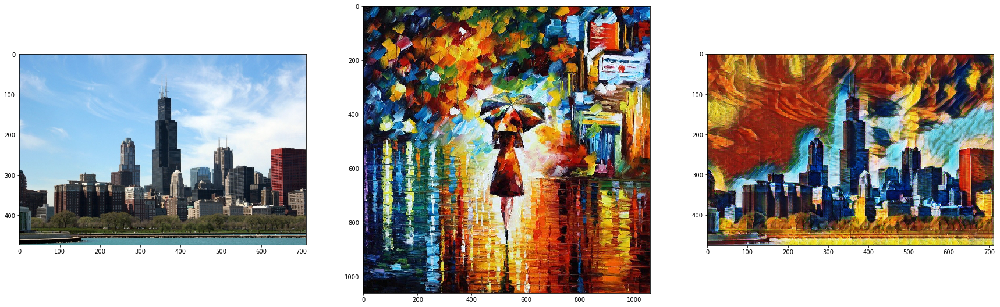

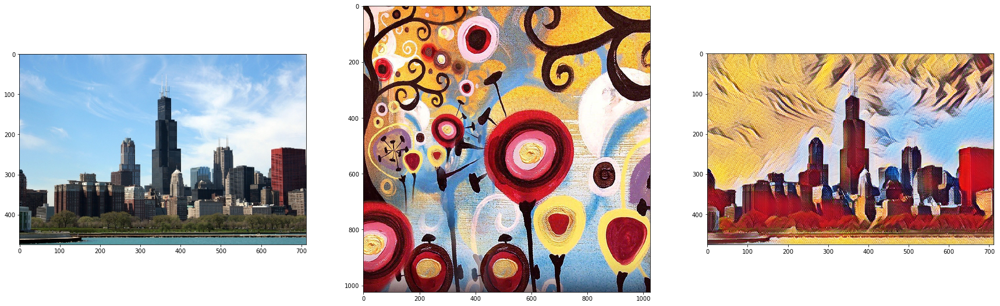

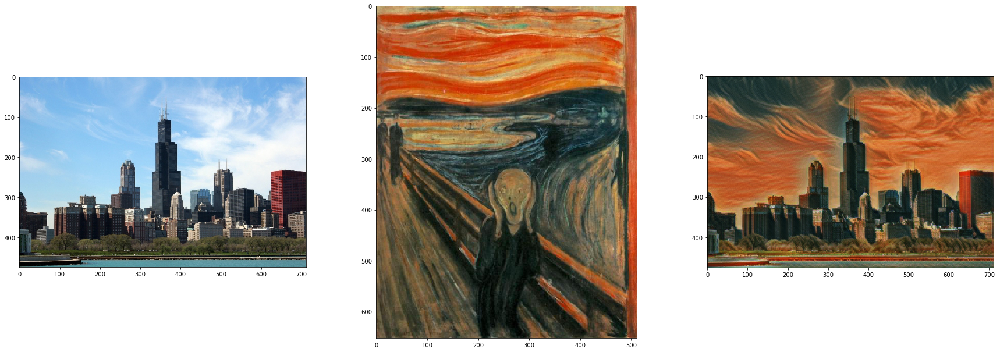

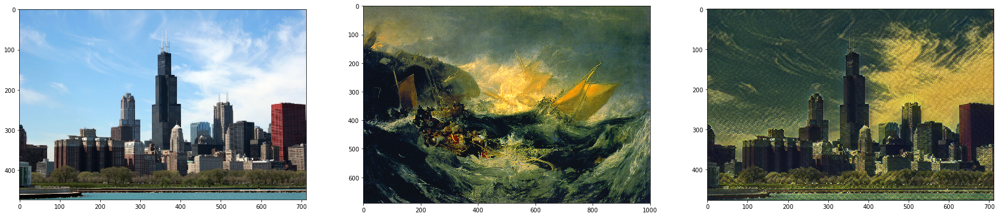

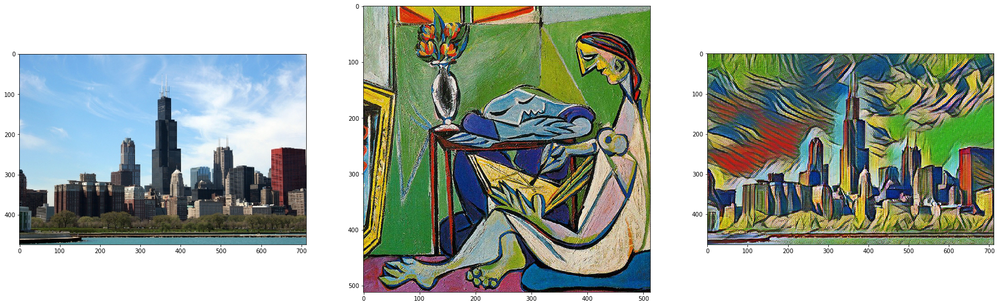

In [1]:
import tensorflow as tf
import numpy as np
from fastStyleNet import transform
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import random

input_path = "input/chicago.jpg"
style_path = ["style/StarryNight.jpg", "style/rain_princess.jpg", "style/candy.jpg", "style/the_scream.jpg", "style/the_shipwreck_of_the_minotaur.jpg", "style/la_muse.jpg"]
model_path = "models/N-style_final.ckpt"

input = Image.open(input_path).convert('RGB')
img_arr = np.array(input, dtype=np.float32)
img = img_arr.reshape((1,) + img_arr.shape)

num_styles = 6
style = [Image.open(style_path[i]).convert('RGB') for i in range(num_styles)] 

image_labels = [idx for idx in range(num_styles)]
print(image_labels)

images = tf.concat([img for _ in range(num_styles)], 0)
with tf.variable_scope('styleNet'):
    Y = transform(images, tf.constant(image_labels), num_styles, norm='cond')
    
saver = tf.train.Saver()
with tf.Session() as sess:
    saver.restore(sess, model_path)
    stylized_images = sess.run(Y)

stylized_images = np.squeeze(stylized_images)

# Plot the images.
figs1 = plt.figure()
figs1.set_size_inches(30, 10.5)
fig1 = figs1.add_subplot(1, 3, 1)
plt.imshow(input)
fig1 = figs1.add_subplot(1, 3, 2)
plt.imshow(style[0])
fig1 = figs1.add_subplot(1, 3, 3)
plt.imshow(stylized_images[0])

figs2 = plt.figure()
figs2.set_size_inches(30, 10.5)
fig2 = figs2.add_subplot(1, 3, 1)
plt.imshow(input)
fig2 = figs2.add_subplot(1, 3, 2)
plt.imshow(style[1])
fig2 = figs2.add_subplot(1, 3, 3)
plt.imshow(stylized_images[1])

figs3 = plt.figure()
figs3.set_size_inches(30, 10.5)
fig3 = figs3.add_subplot(1, 3, 1)
plt.imshow(input)
fig3 = figs3.add_subplot(1, 3, 2)
plt.imshow(style[2])
fig3 = figs3.add_subplot(1, 3, 3)
plt.imshow(stylized_images[2])

figs4 = plt.figure()
figs4.set_size_inches(30, 10.5)
fig4 = figs4.add_subplot(1, 3, 1)
plt.imshow(input)
fig4 = figs4.add_subplot(1, 3, 2)
plt.imshow(style[3])
fig4 = figs4.add_subplot(1, 3, 3)
plt.imshow(stylized_images[3])

figs5 = plt.figure()
figs5.set_size_inches(30, 10.5)
fig5 = figs5.add_subplot(1, 3, 1)
plt.imshow(input)
fig5 = figs5.add_subplot(1, 3, 2)
plt.imshow(style[4])
fig5 = figs5.add_subplot(1, 3, 3)
plt.imshow(stylized_images[4])

figs6 = plt.figure()
figs6.set_size_inches(30, 10.5)
fig6 = figs6.add_subplot(1, 3, 1)
plt.imshow(input)
fig6 = figs6.add_subplot(1, 3, 2)
plt.imshow(style[5])
fig6 = figs6.add_subplot(1, 3, 3)
plt.imshow(stylized_images[5])
    
plt.show()

[0.16666666666666666, 0.16666666666666666, 0.16666666666666666, 0.16666666666666666, 0.16666666666666666, 0.16666666666666666]
INFO:tensorflow:Restoring parameters from models/N-style_final.ckpt


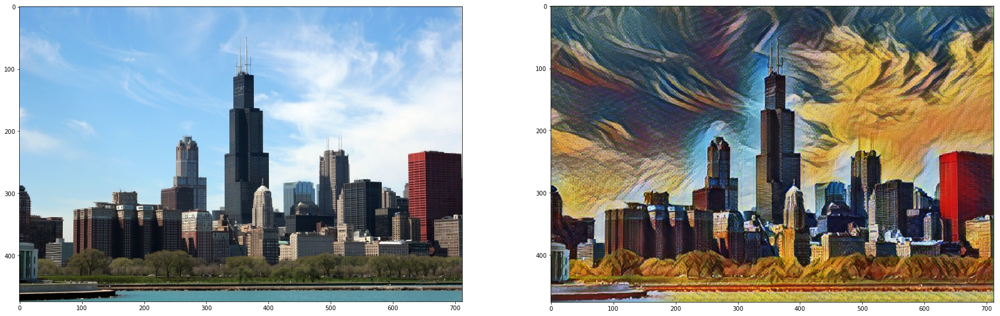

In [2]:
style_weights = [1.0/num_styles for _ in range(num_styles)]
print(style_weights)


tf.reset_default_graph()
with tf.variable_scope('styleNet'):
    Y = transform(img, tf.constant(style_weights), num_styles, norm='weight')
    
saver = tf.train.Saver()
with tf.Session() as sess:
    saver.restore(sess, model_path)
    mixed_images = sess.run(Y)

mixed_images = np.squeeze(mixed_images)


figs = plt.figure()
figs.set_size_inches(30, 10.5)
fig = figs.add_subplot(1, 2, 1)
plt.imshow(input)
fig = figs.add_subplot(1, 2, 2)
plt.imshow(mixed_images)

plt.show()
